### MATH2504 S2, 2023, BigHW Submission 
### Submission form IV of IV 

Student #1 name: Matthew Lynch

Student #1 ID: 47426557

Student #2 name: Felicity Caruana

Student #2 ID: 47425523

GitHub repo: https://github.com/lynchmatt/Matthew-Lynch_Felicity-Caruana-2504-2023-BigHW

---

**Note: It is expected that this notebook be runnable in the sense that the marker can select "Restart & Run All" and all code cells of solutions will execute. This requires not to have name clashes between solutions.**

---

In [ ]:
# PACKAGES NEEDED

LaTeXStrings

Plots

LinearAlgebra

StatsBase

Measures

# Solution to [Question 13](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q13)

## 13a:

In [ ]:
using Plots, LaTeXStrings

# define functions to find numerical derivatives under the forward and central diff schemes
diff_forward(f, x; h=sqrt(eps())) = (f(x+h)-f(x))/h
diff_central(f, x; h=sqrt(eps())) = (f(x+(h/2))-f(x-(h/2)))/h

# define the functions
f1(x) = cos(x^2)
f2(x) = exp(x^2)
f3(x) = atan(x)/(1+exp(-4*x^2))

# define the analytical derivatives for the above functions
f1prime(x) = -sin(x^2)*2*x
f2prime(x) = exp(x^2)*2*x
f3prime(x) = (1+exp(-4*x^2)+8*exp(-4*x^2)*x*atan(x)*(x^2+1))/(x^2+1)*(1+exp(-4*x^2)^2)

# one plot of the error of central diff, one as the error of forward diff
h_range = 10 .^ (-14:0.01:-2)
forward_error_f1 = [abs(diff_forward(f1, 1/2; h=h) - f1prime(1/2))/abs(f1prime(1/2)) for h in h_range]
forward_error_f2 = [abs(diff_forward(f2, 1; h=h) - f2prime(1))/abs(f2prime(1)) for h in h_range]
forward_error_f3 = [abs(diff_forward(f3, 2; h=h) - f3prime(2))/abs(f3prime(2)) for h in h_range]
forward_error_plot = plot(h_range, [forward_error_f1, forward_error_f2, forward_error_f3], yaxis = :log, axis = :log, xlabel="h", ylabel="Absolute relative error", label = ["f1" "f2" "f3"], legend= :bottomright)

central_error_f1 = [abs(diff_central(f1, 1/2; h=h) - f1prime(1/2))/abs(f1prime(1/2)) for h in h_range]
central_error_f2 = [abs(diff_central(f2, 1; h=h) - f2prime(1))/abs(f2prime(1)) for h in h_range]
central_error_f3 = [abs(diff_central(f3, 2; h=h) - f3prime(2))/abs(f3prime(2)) for h in h_range]
central_error_plot = plot(h_range, [central_error_f1, central_error_f2, central_error_f3], yaxis = :log, xaxis = :log, xlabel="h", ylabel="Absolute relative error", label = ["f1" "f2" "f3"], legend= :bottomright)

# find optimal h for foward differentiation scheme for each function
h_f1_forward = h_range[argmin(forward_error_f1)] 
h_f2_forward = h_range[argmin(forward_error_f2)]
h_f3_forward = h_range[argmin(forward_error_f3)] 
println("For f1, the minimum error under the forward difference scheme is $(minimum(forward_error_f1)) and occurs when h is $h_f1_forward")
println("For f2, the minimum error under the forward difference scheme is $(minimum(forward_error_f2)) and occurs when h is $h_f2_forward")
println("For f3, the minimum error under the forward difference scheme is $(minimum(forward_error_f3)) and occurs when h is $h_f3_forward")

# find optimal h for central differentiation scheme for each function
h_f1_central = h_range[argmin(central_error_f1)] 
h_f2_central = h_range[argmin(central_error_f2)]
h_f3_central = h_range[argmin(central_error_f3)]
println("For f1, the minimum error under the central difference scheme is $(minimum(central_error_f1)) and occurs when h is $h_f1_central")
println("For f2, the minimum error under the central difference scheme is $(minimum(central_error_f2)) and occurs when h is $h_f2_central")
println("For f3, the minimum error under the central difference scheme is $(minimum(central_error_f3)) and occurs when h is $h_f3_central")

plot(forward_error_plot, central_error_plot, size = (800,400))

## 13b:

For a vector $z$ of dimension $K$, the softmax function's Jacobian will be a matrix of $K\times K$ dimensions.
Under the forward difference scheme, the partial derivatives will be given by
$$ S_j'(z_i) = \frac{S(\textbf{z}+he_i)-S(\textbf{z})}{h} $$

The term $S(\textbf{z}+he_i)$ will be different for each row of the Jacobian, so the softmax function must be done at least $K$ times for dimensions $K\times K$.  The right term $S(\textbf{z})$ will be the same between rows, and so needs to only be called once and can then be reused. Thus for the forward difference scheme, the softmax function has to be called $K+1$ times.

Under the central difference scheme, the partial derivatives will be given by
$$ S_j'(z_i) = \frac{S(\textbf{z}+ he_i/2)-S(\textbf{z}-he_i/2)}{h} $$

The term $S(\textbf{z}+he_i)$ will be different for each row of the Jacobian, so the softmax function must be done at least $K$ times for dimensions $K\times K$. In the central difference scheme, the right term $S(\textbf{z}-he_i)$ will also be different between rows. Thus for the forward difference scheme, the softmax function has to be called $2K$ times.

## 13c:

In [ ]:
using LinearAlgebra, Plots

# define the softmax function
function softmax(z)
    softmax_result = exp.(z) ./sum(exp.(z))
    return softmax_result
end

# define different z vectors, for different values of K
z1 = [i^(1/3) for i in 1:10]
z2 = [i^(1/3) for i in 1:20]
z3 = [i^(1/3) for i in 1:100]

# create a function that makes the jacobian with the forward difference scheme
function forward_diff_jacobian(z::Vector{Float64}, h::Float64)
    forward_diff_matrix = zeros(length(z), length(z))
    reused = softmax(z)
    for j in 1:length(z)
        relevant_index = copy(z)
        relevant_index[j] = relevant_index[j] + h
        a = (softmax(relevant_index) - reused)./h
        forward_diff_matrix[:,j] = a
    end 
    return forward_diff_matrix
end

function central_diff_jacobian(z::Vector{Float64}, h::Float64)
    central_diff_matrix = zeros(length(z), length(z))
    for j in 1:length(z)
        relevant_index_neg = copy(z) # create a version of z where h is added to the variable that's being differentiated with respect to
        relevant_index_pos = copy(z)
        relevant_index_neg[j] = relevant_index_neg[j] - h/2
        relevant_index_pos[j] = relevant_index_pos[j] + h/2
        central_diff_matrix[:,j] = (softmax(relevant_index_pos) - softmax(relevant_index_neg))./h
    end
    return central_diff_matrix
end

function explicit_jacobian(z)
    softmax_result = softmax(z)
    explicit_matrix = Array{Float64}(undef, length(z), length(z))
    for i in 1:length(z)
        for j in 1:length(z)
            if i == j
                explicit_matrix[i,j] = softmax_result[i]*(1-softmax_result[i])
            else
                explicit_matrix[i,j] = -softmax_result[i]*softmax_result[j]
            end
        end
    end
    return explicit_matrix
end

# euclidian difference between forward/explicit jacobian for a vector z
function euclid_dist_forward(z, h)
    explicit = explicit_jacobian(z)
    forward = forward_diff_jacobian(z, h)
    distance_sum = 0
    for i in 1:length(z)
        for j in 1:length(z)
            distance_sum += (explicit[i,j] - forward[i,j])^2
        end
    end
    dist_forward = sqrt(distance_sum)
    return dist_forward
end

# euclidian difference between central/explicit jacobian for a vector z
function euclid_dist_cent(z, h)
    explicit = explicit_jacobian(z)
    central = central_diff_jacobian(z,h)
    distance_sum = 0
    for i in 1:length(z)
        for j in 1:length(z)
            distance_sum += (explicit[i,j] - central[i,j])^2
        end
    end
    dist_central = sqrt(distance_sum)
    return dist_central
end
          
h_range_sm = 10 .^ (-14:0.01:-2)

# create plot for error of forward diff jacobian for K=10,20,100
error_forward_z1 = [euclid_dist_forward(z1, h) for h in h_range_sm]
error_forward_z2 = [euclid_dist_forward(z2, h) for h in h_range_sm]
error_forward_z3 = [euclid_dist_forward(z3, h) for h in h_range_sm]

error_central_z1 = [euclid_dist_cent(z1,h) for h in h_range_sm]
error_central_z2 = [euclid_dist_cent(z2,h) for h in h_range_sm]
error_central_z3 = [euclid_dist_cent(z3,h) for h in h_range_sm]

# plot the error for the forward diff jacobian as a function of h
forward_distance_plot = plot(h_range_sm, [error_forward_z1, error_forward_z2, error_forward_z3], yaxis = :log, xaxis = :log, xlabel="h", ylabel="Error as Euclidean Distance", label = ["K=10" "K=20" "K=100"], legend= :bottomright)

# plot the error for the central diff jacobian as a function of h
central_distance_plot = plot(h_range_sm, [error_central_z1, error_central_z2, error_central_z3], yaxis = :log, xaxis = :log, xlabel="h", ylabel="Error as Euclidean Distance", label = ["K=10" "K=20" "K=100"], legend= :bottomright)

# find optimal h for forward differentiation jacobian for each function
best_h_forward_z1 = h_range_sm[argmin(error_forward_z1)]
best_h_forward_z2 = h_range_sm[argmin(error_forward_z2)]
best_h_forward_z3 = h_range_sm[argmin(error_forward_z3)]
println("For K=10, the minimum error under the forward difference scheme is $(minimum(error_forward_z1)) and occurs when h is $best_h_forward_z1")
println("For K=20, the minimum error under the forward difference scheme is $(minimum(error_forward_z2)) and occurs when h is $best_h_forward_z2")
println("For K=100, the minimum error under the forward difference scheme is $(minimum(error_forward_z3)) and occurs when h is $best_h_forward_z3")


# find optimal h for central differentiation jacobian for each function
best_h_central_z1 = h_range_sm[argmin(error_central_z1)]
best_h_central_z2 = h_range_sm[argmin(error_central_z2)]
best_h_central_z3 = h_range_sm[argmin(error_central_z3)]
println("For K=10, the minimum error under the central difference scheme is $(minimum(error_central_z1)) and occurs when h is $best_h_central_z1")
println("For K=20, the minimum error under the central difference scheme is $(minimum(error_central_z2)) and occurs when h is $best_h_central_z2")
println("For K=100, the minimum error under the central difference scheme is $(minimum(error_central_z3)) and occurs when h is $best_h_central_z3")

plot(forward_distance_plot, central_distance_plot, size = (1000,400))


---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 14](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q14)

---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

In [22]:
norm([1,2]-[2,3])

1.4142135623730951

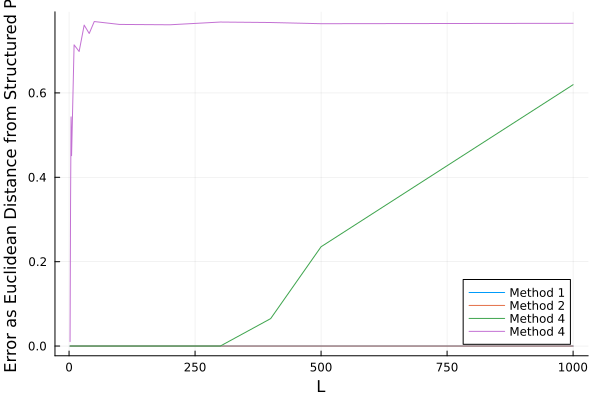

In [122]:
using LinearAlgebra, StatsBase, Plots

function structured_P(L::Int; p::Float64 = 0.45, r::Float64 = 0.01)::Matrix{Float64}
    q = 1 - p - r
    P = diagm(fill(r,L)) + diagm(-1=>fill(q,L-1)) + diagm(1 => fill(p,L-1))
    P[1,1] = 1-p
    P[L,L] = 1-q
    return P
end

structured_π(L::Int; p::Float64 = 0.45, r::Float64 = 0.01)::Vector{Float64} = begin
    q = 1 - p - r
    [(p/q)^i  for i in 1:L] * (q-p) / p / (1-(p/q)^L) #Explicit expression (birth death)
end;


# method 1. take input as dimension L, call structured functions inside this
# function and return true/false, depending on if they're approximately equal
function method_1(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    checker_1 = true
    method_1_result = stat_prob'*matrix
    return method_1_result'
end


# method 2. choose large n, see if the i-jth element of the matrix to that power is equal
# to the jth element of structured pi.
function method_2(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    n = big(20000) # choose some big n
    limit_matrix = matrix^n
    method_2_result = limit_matrix[1,:]
    return method_2_result
end


# method 3. find eigens of matrix, largest one should be 1. find vector associated with
# evalue 1. vector pi should be proportional to the evector associated with 1. 
function method_3(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    eigvalues, righteigvectors = eigen(matrix)
    lefteigvectors = inv(righteigvectors)
    method_3_result = lefteigvectors[L,:]/sum(lefteigvectors[L,:])
    return method_3_result
end


# method 4
function method_4(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    N = 1000 # choose some large N
    # create a uniform probability distribution and sample from it to generate the first state
    X = [sample(1:L, Weights([1/L for i in 1:L]), 1)...]
    previous_X = X[1]
    states = zeros(N)
    # iterate through to create a sequences of N states. draws from the corresponding row of the transition matrix,
    # which is the probability of switching from one state to another.
    for n in 1:N
        states[n] = sample(1:L, Weights(matrix[previous_X,:],1))
        previous_X = X[end]
    end
    indicator = zeros(N)
    method_4_result = zeros(L)
    for i in 1:L
        for n in 1:N
            if states[n] == i
                indicator[n] = 1
            else
                indicator[n] = 0
            end
        method_4_result[i] = sum(indicator)/N
        end
    end
    method_4_result = [sum([states[n] == i for n in 1:N]) for i in 1:L]/N
    return method_4_result
end


# plot accuracy of methods (using euclidean distance from structured_pi) as a function of L
l_range = [2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]
accuracy_1 = [norm(method_1(a)-structured_π(a)) for a in l_range]
accuracy_2 = [norm(method_2(a)-structured_π(a)) for a in l_range]
accuracy_3 = [norm(method_3(a)-structured_π(a)) for a in l_range]
accuracy_4 = [norm(method_4(a)-structured_π(a)) for a in l_range]


plot(l_range, [accuracy_1, accuracy_2, accuracy_3, accuracy_4], xlabel="L", ylabel="Error as Euclidean Distance from Structured Pi", label = ["Method 1" "Method 2" "Method 4" "Method 4"], legend= :bottomright)



# Solution to [Question 15](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q15)

## 15a:

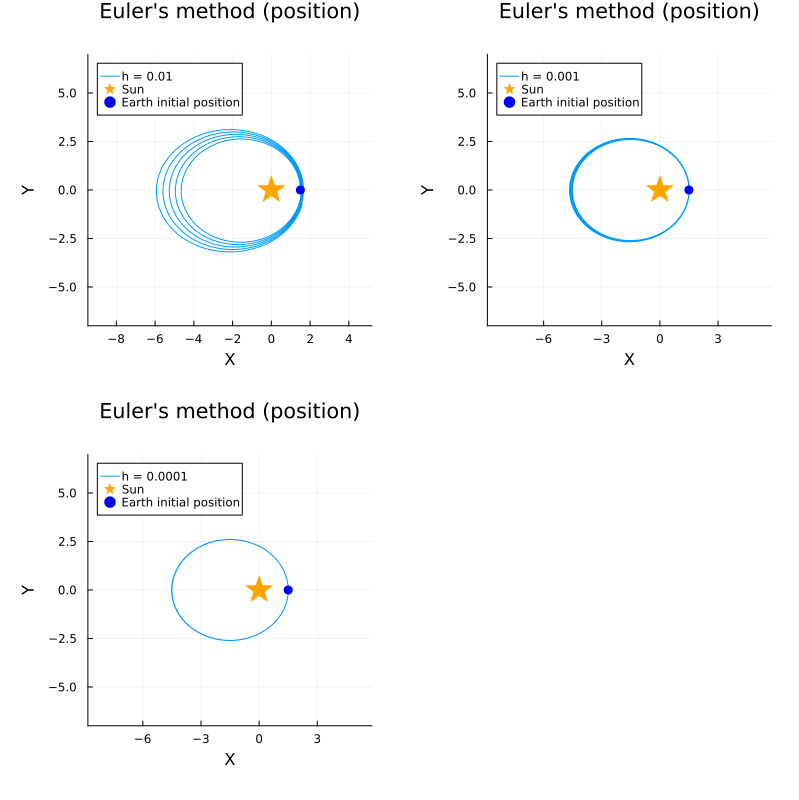

In [31]:
#These four convenience functions extract the state variable from the state vector
#It is assumed the layout of the vector u is u = [v_x, v_y, x, y]
state_v_x(u::Vector{Float64}) = u[1]
state_v_y(u::Vector{Float64}) = u[2]
state_x(u::Vector{Float64}) = u[3]
state_y(u::Vector{Float64}) = u[4]

"""
Computes the RHS for the one body problem. 
"""
function df_dt_one_body(u::Vector{Float64}, t::Float64)::Vector{Float64}
    M, G = 1, 1
    r = sqrt(state_x(u)^2 + state_y(u)^2)
    return [-M*G*state_x(u)/r^3, -M*G*state_y(u)/r^3, state_v_x(u), state_v_y(u)]
end;

using Plots, Measures
using StatsBase ; sample

function plot_energy_solution( t::AbstractArray{T}, 
                        u::Vector{Vector{Float64}}; 
                        title::String = "",
                        label::Union{String, Bool} = false) where T
    x, y, v_x, v_y = state_x.(u), state_y.(u), state_v_x.(u), state_v_y.(u)
 
    #"Energy"
    r = @. sqrt(x^2 + y^2)
    E = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
    
    # create energy plot
    p4 = plot(  t, E, xlabel = "Time", ylabel = "Energy",
                label = label, title = title*" (energy)")
    plot(p4, margin = 10mm,size=(800,400))
end;

function plot_position_solution( t::AbstractArray{T}, 
                        u::Vector{Vector{Float64}}; 
                        title::String = "",
                        label::Union{String, Bool} = false) where T
    x, y, v_x, v_y = state_x.(u), state_y.(u), state_v_x.(u), state_v_y.(u)
 
    #"Position"
    r = @. sqrt(x^2 + y^2)
    E = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
    # create Position plot
    p1 = plot(  x, y, label = label, xlabel= "X", ylabel = "Y",
                title = title*" (position)", aspectratio=1,legend=:topleft,ylim=(-7,7))
    scatter!([0], [0], ms=15, msw=0, c=:orange, shape =:star, label="Sun")
    scatter!([x[1]], [y[1]], ms=5, msw=0, c=:blue, shape =:circle, label="Earth initial position")
    plot(p1, margin = 10mm,size=(800,400))
end;


# use euler's method to find the next u vector
function euler_next_u(u::Vector{Float64}, h::Float64, t::Float64)
    next_u = u + h * df_dt_one_body(u, t)
    return next_u
end

#initialise an empty array to hold the plots
plots_position = []
plots_energy = []

#define an array containing each step size
h_array = [0.01, 0.001, 0.0001] 

#define initial conditions
u_0 = [0.0, 1, 1.5, 0]

# create plots for position
for (index, h) in enumerate(h_array) #iterate through each stepsize
    
    #initialise an array that holds all the u vectors
    u_array = [u_0]
    
    t_range = 0:h:200
    
    for t in t_range[2:end] #iterate over time values
        #do eulers method for the last added vector to the u array
        next_u = euler_next_u(u_array[end], h, t) 
        push!(u_array, next_u) #add the new vector to the u array
    end
    
    #plot every 10th data point
    push!(plots_position, plot_position_solution(t_range[1:10:end], u_array[1:10:end], title = "Euler's method", label = "h = $h"))
    push!(plots_energy, plot_energy_solution(t_range[1:10:end], u_array[1:10:end], title = "Euler's method", label = "h = $h"))
end


plot(plots_position..., size = (800,800), margin = 5mm)

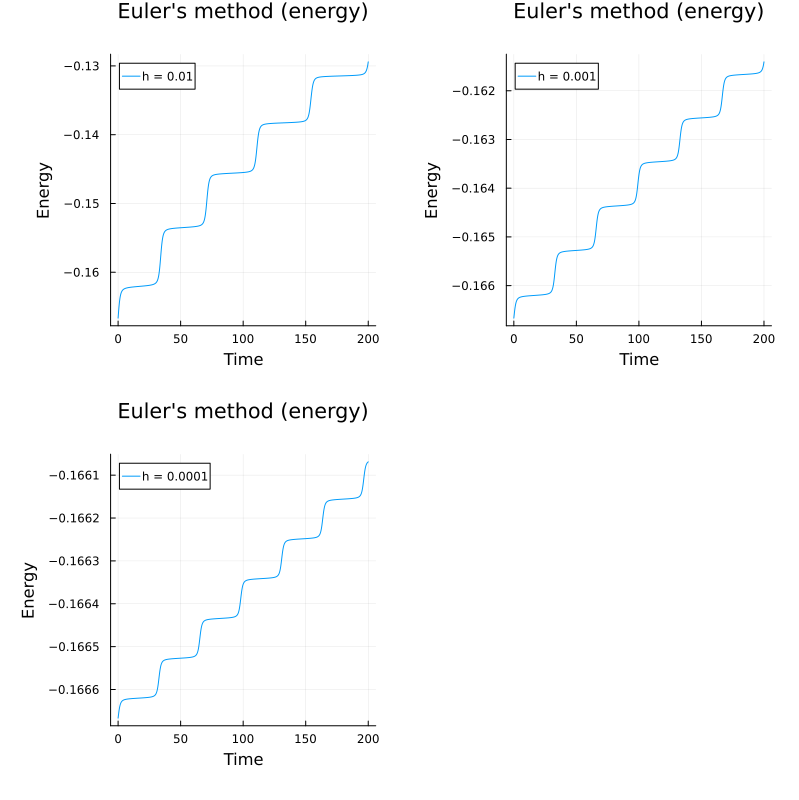

In [47]:
plot(plots_energy..., size = (800,800), margin = 5mm)

## 15b:

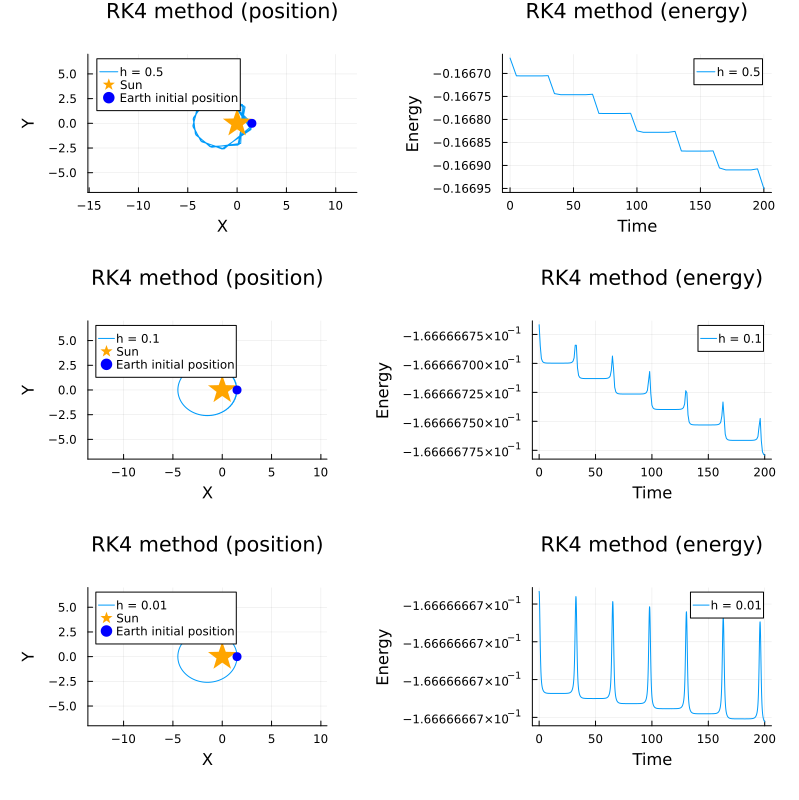

In [16]:
# Define RK4 method function
function RK4_next_u(u::Vector{Float64}, h::Float64, t::Float64)
    k1 = df_dt_one_body(u, t)
    k2 = df_dt_one_body(u + h*k1/2, t)
    k3 = df_dt_one_body(u + h*k2/2, t)
    k4 = df_dt_one_body(u + h*k3, t)
    
    RK4_next_u = u + ((h/6) *(k1 +2*k2 + 2*k3 + k4))
    return RK4_next_u
end

#initialise an empty array to hold the plots
plots = []

#define an array containing each step size
h_array = [0.5, 0.1, 0.01] 

for (index, h) in enumerate(h_array) #iterate through each stepsize
    
    #define initial conditions
    u_0 = [0.0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an array that holds all the u vectors
    u_array = [u_0]
    
    for t in t_range[2:end] #iterate over time values
        #do RK4 method for the last added vector to the u array
        next_u = RK4_next_u(u_array[end], h, t) 
        push!(u_array, next_u) #add the new vector to the u array
    end
    
    #plot every 10th data point
    push!(plots, plot_solution(t_range[1:10:end], u_array[1:10:end], title = "RK4 method", label = "h = $h"))
    
end

plot(plots..., size = (800,800), margin = 5mm, layout = (3,1))

## 15c:

**General Efficiency and Ability to Predict Trajectory**

Implementing Euler's method only requires the df_dt_one_body function to be called once, whereas it is called 4 times in the RK4 method. This leads to the RK4 method having a lower computational efficiency. 

However, the simplicity of Euler's method results in slight deviations in trajectory over a longer time period. Because the trajectory of the Earth around the sun is elliptical, the function is curved between small time periods. However, Euler's method does not acount for this curve. The error that this assumption causes then accumulates with each iteration of the method, resulting in  deviations from the true trajectory. 

The RK4 method is an extension on Euler's method that decreases the accumulated error over each iteration. k1 is the slope at the start of the interval (this is what Euler's method uses). The approximation is then improved by calculating the slopes at 3 additional intermediate points within the interval. The next value of the unknown function is determined by using a weighted average of these 4 slopes. 

**Efficiency as a Function of h**

The RK4 method is a fourth order method, meaning the total accumulated error is of the order O(h<sup>4</sup>). Since Euler's method is a first order method, the error accumulates linearly after each step. Thus the total accumulated error is of order O(h). 

Consider h = 0.001, which was used above for both methods. The total accumulated error in Euler's method is of order 10<sup>-3</sup> wheras the RK4 method has an accumulated error of order 10<sup>-12</sup>. In Euler's method, the approximation of the curve as a straight line becomes more valid as h decreases.

Thus much larger step sizes can be used in the RK4 method to obtain the same amount of accuracy as a smaller step size in Euler's method. 


## 15d:

In [ ]:
using Plots

# plot the best and worst trajectories using the RK4 and euler methods
# based on discussion, use h=0.001
RK4_next_u

euler_next_u

---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 16](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q16)

## 16a:

In [ ]:
### Answer 16a here (in place of this comment)

## 16b:

In [ ]:
### Answer 16b here (in place of this comment)

## 16c:

In [ ]:
### Answer 16c here (in place of this comment)

## 16d:

In [ ]:
### Answer 16d here (in place of this comment)

---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 17](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q17)

In Dr Dawson’s seminar, she discussed her educational and career paths, and how she uses programming and mathematics in her line of work. Initially, she completed a Bachelor of Mechatronics at QUT. Although her undergraduate studies did not focus specifically on mathematics and software use, she uses such tools heavily. She has gained on-the-job experience in cloud computing, Julia, Python, MATLAB and C++, among others.

After completing her undergraduate studies, she undertook an internship at CSIRO, during which she worked to develop an autonomous vision-based target detection system for an underwater vehicle.  A key point she made was that the language that’s best for writing in may not be the best language for actually executing the program; languages that are easy to code in may take longer to execute than less-intuitive languages. However, she said that Julia is appealing because it can be both easy to use and easily implemented. Knowing that Julia is actually a key tool used in research and industry does make the difficulty of this course feel worth it.

Following her work at CSIRO, she completed a PhD at UQ, which focused on statistical analysis of orientation and TDOA-based geolocation estimation – in doing this, she had to answer key questions about how position estimates are generated, such as how predictors perform in different situations, if a solution can be generated and how accurate this solution is. After completing her PhD, she worked at multiple positions, including for Shell, Origin Energy and Boeing.

Dr Dawson currently works at Fugro, a leading company in the energy, infrastructure and water markets. In this position, she works as a team lead in Fugro Roames, which assesses and monitors powerline infrastructure over a large area for clients. Her team is responsible for taking the data gathered via LIDAR and autonomously classifying the physical structures, which creates a 3D image of the area. A key point I picked up is that a significant part of many of her jobs is being able to predict and fix complications in a solution she’s created for a given problem. For example, she and her team at Fugro need to be able to identify and deal with the risks and uncertainties associated with taking a single LIDAR scan of an area that may change over time. As I continue in my studies and career, I think it will be useful to remember that coming up with a solution – whether it be programmatic or mathematic in nature – is only the first step in solving real-world problems. In reality, much more work is done in fixing things as they break and improving on existing solutions.
